# K-means and K-means++ Clustering on MNIST Dataset

In this lab, we will explore the application of k-means and k-means++ clustering algorithms on the MNIST dataset of handwritten digits. We aim to:

- Understand the importance of initialization in k-means clustering.
- Compare the performance of random initialization vs. k-means++ initialization.
- Visualize high-dimensional data using dimensionality reduction techniques.

[Referance](https://github.com/sharmaroshan/MNIST-Using-K-means/blob/master/KMeans%20Clustering%20for%20Imagery%20Analysis%20(Jupyter%20Notebook).ipynb)

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
import seaborn as sns


# Data preparation

In [4]:
# Load MNIST dataset
mnist = fetch_openml('mnist_784', version=1, as_frame=False)
X, y = mnist['data'], mnist['target']
y = y.astype(int)


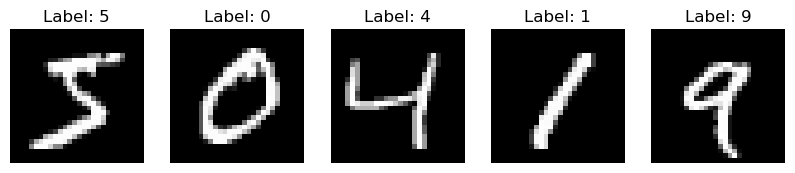

In [6]:
# Display sample images
fig, axes = plt.subplots(1, 5, figsize=(10, 3))
for i, ax in enumerate(axes):
    ax.imshow(X[i].reshape(28, 28), cmap='gray')
    ax.set_title(f'Label: {y[i]}')
    ax.axis('off')
plt.show()


In [8]:
# Normalize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# Dimensionality reduction

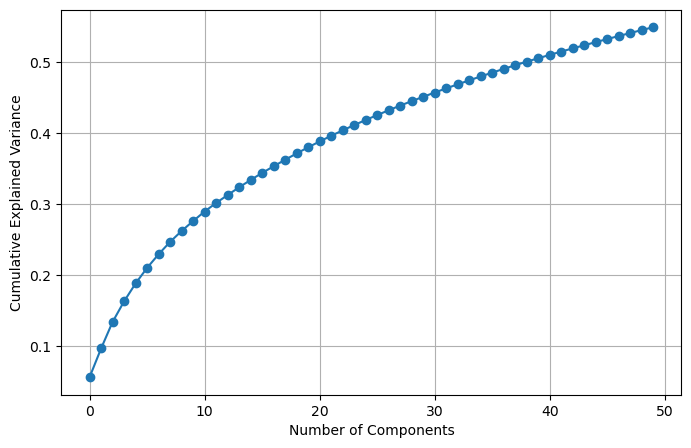

In [10]:
# Reduce dimensions with PCA
pca = PCA(n_components=50)
X_pca = pca.fit_transform(X_scaled)

# Plot cumulative explained variance
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()


# K-Means

In [17]:
k = 10
# k-means with random initialization
kmeans_random = KMeans(n_clusters=k, init='random', n_init=10, )
%time kmeans_random.fit(X_pca)


CPU times: total: 25.6 s
Wall time: 3.91 s


KMeans(init='random', n_clusters=10, n_init=10)

In [16]:
# k-means with k-means++ initialization
kmeans_pp = KMeans(n_clusters=k, init='k-means++', n_init=10,)
%time kmeans_pp.fit(X_pca)


CPU times: total: 32.9 s
Wall time: 4.72 s


KMeans(n_clusters=10, n_init=10)

In [20]:
print(f'Inertia with random initialization: {kmeans_random.inertia_}')
print(f'Inertia with k-means++ initialization: {kmeans_pp.inertia_}')


Inertia with random initialization: 19899423.710042782
Inertia with k-means++ initialization: 19899359.02997631


In [22]:
# Silhouette Score for random initialization
silhouette_random = silhouette_score(X_pca, kmeans_random.labels_)
print(f'Silhouette Score with random initialization: {silhouette_random}')

# Silhouette Score for k-means++ initialization
silhouette_pp = silhouette_score(X_pca, kmeans_pp.labels_)
print(f'Silhouette Score with k-means++ initialization: {silhouette_pp}')


Silhouette Score with random initialization: 0.07300011202543662
Silhouette Score with k-means++ initialization: 0.07333281110838458


In [24]:
print(f'Iterations with random initialization: {kmeans_random.n_iter_}')
print(f'Iterations with k-means++ initialization: {kmeans_pp.n_iter_}')


Iterations with random initialization: 63
Iterations with k-means++ initialization: 102


In [26]:
# Reduce to 2 components for visualization
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)


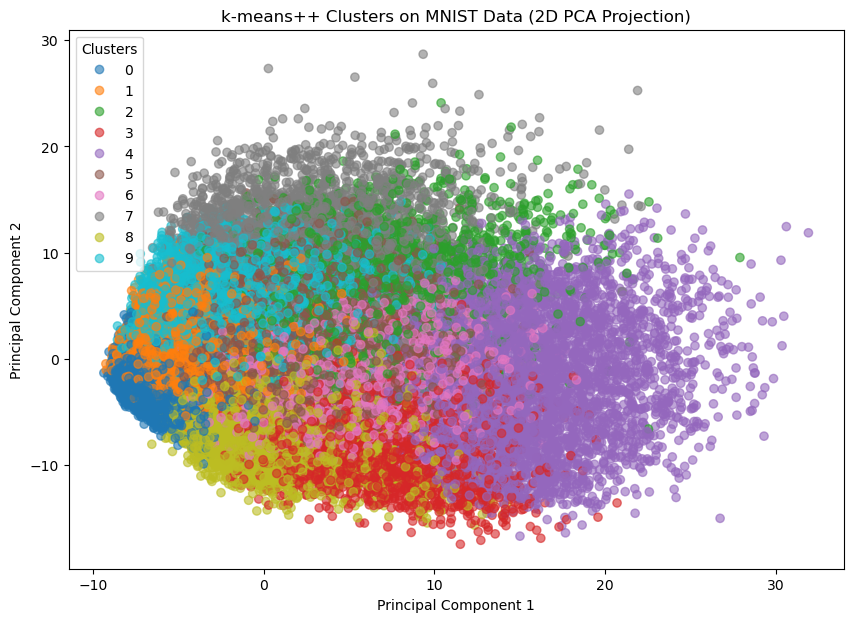

In [28]:
# Assign labels from k-means++
labels = kmeans_pp.labels_

# Plot clusters
plt.figure(figsize=(10, 7))
scatter = plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=labels, cmap='tab10', alpha=0.6)
plt.legend(*scatter.legend_elements(), title='Clusters')
plt.title('k-means++ Clusters on MNIST Data (2D PCA Projection)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


In [30]:
!pip install plotly

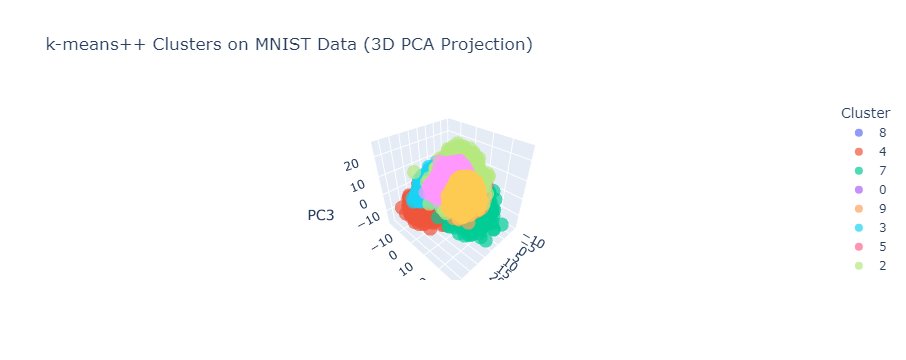

In [32]:
import plotly.express as px
import pandas as pd

# Reduce to 3 components for visualization
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

# Assign labels from k-means++
labels = kmeans_pp.labels_

# Create a DataFrame for Plotly
df_plot = pd.DataFrame({
    'PC1': X_pca_3d[:, 0],
    'PC2': X_pca_3d[:, 1],
    'PC3': X_pca_3d[:, 2],
    'Cluster': labels.astype(str)  # Convert labels to strings for categorical coloring
})

# Create an interactive 3D scatter plot
fig = px.scatter_3d(
    df_plot, x='PC1', y='PC2', z='PC3',
    color='Cluster',
    title='k-means++ Clusters on MNIST Data (3D PCA Projection)',
    opacity=0.7
)

# Show the plot
fig.show()


In [34]:
def infer_cluster_labels(kmeans, actual_labels):
    """
    Associates most probable label with each cluster in KMeans model
    returns: dictionary of clusters assigned to each label
    """

    inferred_labels = {}

    for i in range(kmeans.n_clusters):

        # find index of points in cluster
        labels = []
        index = np.where(kmeans.labels_ == i)

        # append actual labels for each point in cluster
        labels.append(actual_labels[index])

        # determine most common label
        if len(labels[0]) == 1:
            counts = np.bincount(labels[0])
        else:
            counts = np.bincount(np.squeeze(labels))

        # assign the cluster to a value in the inferred_labels dictionary
        if np.argmax(counts) in inferred_labels:
            # append the new number to the existing array at this slot
            inferred_labels[np.argmax(counts)].append(i)
        else:
            # create a new array in this slot
            inferred_labels[np.argmax(counts)] = [i]

        #print(labels)
        #print('Cluster: {}, label: {}'.format(i, np.argmax(counts)))
        
    return inferred_labels  

def infer_data_labels(X_labels, cluster_labels):
    """
    Determines label for each array, depending on the cluster it has been assigned to.
    returns: predicted labels for each array
    """
    
    # empty array of len(X)
    predicted_labels = np.zeros(len(X_labels)).astype(np.uint8)
    
    for i, cluster in enumerate(X_labels):
        for key, value in cluster_labels.items():
            if cluster in value:
                predicted_labels[i] = key
                
    return predicted_labels
# test the infer_cluster_labels() and infer_data_labels() functions
cluster_labels = infer_cluster_labels(kmeans_random, y)
X_clusters = kmeans_random.predict(X_pca)
predicted_labels = infer_data_labels(X_clusters, cluster_labels)
print(predicted_labels[:20])
print(y[:20])

[5 0 7 1 4 2 1 3 1 5 3 5 2 6 1 7 3 5 6 7]
[5 0 4 1 9 2 1 3 1 4 3 5 3 6 1 7 2 8 6 9]


In [36]:
from sklearn import metrics

def calculate_metrics(estimator, data, labels):

    # Calculate and print metrics
    print('Number of Clusters: {}'.format(estimator.n_clusters))
    print('Inertia: {}'.format(estimator.inertia_))
    print('Homogeneity: {}'.format(metrics.homogeneity_score(labels, estimator.labels_)))

clusters = [10, 16, 36, 64, 144, 256]

# test different numbers of clusters
for n_clusters in clusters:
    estimator = KMeans(n_clusters = n_clusters)
    estimator.fit(X)
    
    # print cluster metrics
    calculate_metrics(estimator, X_pca, y)
    
    # determine predicted labels
    cluster_labels = infer_cluster_labels(estimator, y)
    predicted_Y = infer_data_labels(estimator.labels_, cluster_labels)
    
    # calculate and print accuracy
    print('Accuracy: {}\n'.format(metrics.accuracy_score(y, predicted_Y)))

Number of Clusters: 10
Inertia: 178462557278.49854
Homogeneity: 0.48328030207360423
Accuracy: 0.5803857142857143

Number of Clusters: 16
Inertia: 166210474593.94754
Homogeneity: 0.5843431345470186
Accuracy: 0.6790714285714285

Number of Clusters: 36
Inertia: 146454655022.09476
Homogeneity: 0.7173553114011637
Accuracy: 0.7948142857142857

Number of Clusters: 64
Inertia: 135117967279.5947
Homogeneity: 0.761227706097052
Accuracy: 0.8372142857142857

Number of Clusters: 144
Inertia: 121116321199.37845
Homogeneity: 0.8262956867034152
Accuracy: 0.8895285714285714

Number of Clusters: 256
Inertia: 111976836473.70694
Homogeneity: 0.8557868004345909
Accuracy: 0.9123285714285714



## Discussion

- **Initialization Impact**: k-means++ initialization results in lower inertia and higher silhouette scores compared to random initialization, indicating better clustering performance.
- **Convergence Speed**: k-means++ typically converges in fewer iterations due to better initial centroid placement.
- **Cluster Interpretability**: The confusion matrix shows that some clusters correspond well to certain digits, while others are mixed, highlighting the challenges of clustering high-dimensional data.
- **Dimensionality Reduction**: PCA helps in visualizing high-dimensional data but may not capture all the nuances necessary for perfect clustering.

## Conclusions

- **k-means++** provides a significant improvement over random initialization in terms of clustering quality and convergence speed.
- **High-dimensional Data**: Clustering in high-dimensional spaces is challenging due to the curse of dimensionality; dimensionality reduction techniques are essential for visualization and sometimes for improving clustering performance.


E:\anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1972: UserWarning:

MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 1536 or by setting the environment variable OMP_NUM_THREADS=4



IndexError: index 22 is out of bounds for axis 0 with size 22

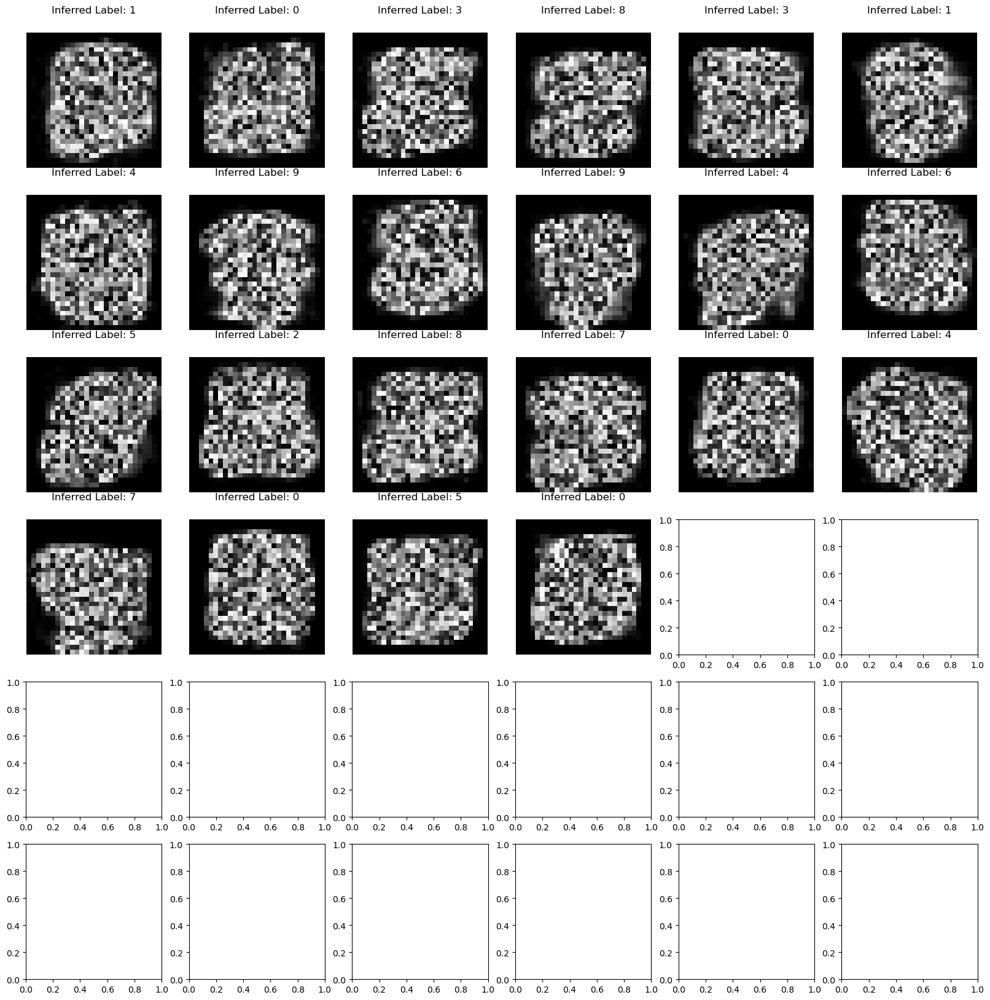

In [46]:
from sklearn.cluster import MiniBatchKMeans
# Initialize and fit KMeans algorithm
Ks = 22
kmeans = MiniBatchKMeans(n_clusters = Ks)
kmeans.fit(X)

# record centroid values
centroids = kmeans.cluster_centers_

# reshape centroids into images
images = centroids.reshape(Ks, 28, 28)
images *= 255
images = images.astype(np.uint8)

# determine cluster labels
cluster_labels = infer_cluster_labels(kmeans, y)

# create figure with subplots using matplotlib.pyplot
fig, axs = plt.subplots(6, 6, figsize = (20, 20))
plt.gray()

# loop through subplots and add centroid images
for i, ax in enumerate(axs.flat):
    
    # determine inferred label using cluster_labels dictionary
    for key, value in cluster_labels.items():
        if i in value:
            ax.set_title('Inferred Label: {}'.format(key))
    
    # add image to subplot
    ax.matshow(images[i])
    ax.axis('off')
    
# display the figure
fig.show()